# GANs and municipality of Amsterdam
Author Code: 
    Max Keuken (mkeuken@ggd.amsterdam.nl)

Goal of the code:

    Proof of concept with a GAN that generates plausible data with a number of quality checks that we can discuss with a privacy officer. 

## Import modules, set paths and load in data

In [ ]:
# %%capture
!pip install sdv

In [ ]:
!pip uninstall pandas-profiling
!pip install pandas-profiling[notebook,html]

In [ ]:
import pandas as pd
import random
from pandas_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt

# Model
from sdv.tabular import CTGAN

# Metrics
from sdmetrics.reports.single_table import DiagnosticReport
from sdmetrics.reports.single_table import QualityReport
from sdmetrics.reports import utils

In [6]:
# We have to mount our Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Check pwd to see if mount was succesfull
!pwd

/content


In [7]:
# Load data 
# The data is a random subset of "COVID-19_Case_Surveillance_Public_Use_Data.csv" for testing purposes
# Full dataset is in data_dir and found on https://data.cdc.gov/Case-Surveillance/COVID-19-Case-Surveillance-Public-Use-Data/vbim-akqf 
data_dir = "/content/drive/MyDrive/Werk/Gemeente Amsterdam/Projecten/SynthGAN/20220113_SDV_Playground/Data/"
df = pd.read_csv(data_dir + "Subset_COVID-19_Case_Surveillance_Public_Use_Data.csv")

In [ ]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile

## GAN

### Metadata

In [10]:
metadata = {
    'fields': {
        "UniqueID" : {'type': 'id', 'subtype': 'integer'}, 
        "sex" : {'type': 'categorical'}, 
        "age_group" : {'type': 'categorical'}, 
        "race_ethnicity_combined": {'type': 'categorical'},
        "cdc_case_earliest_dt" : {"type": "datetime", "format": "%Y-%m-%d"},
        "cdc_report_dt" : {"type": "datetime", "format": "%Y-%m-%d"}, 
        "pos_spec_dt" : {"type": "datetime", "format": "%Y-%m-%d"},
        "onset_dt" : {"type": "datetime", "format": "%Y-%m-%d"},
        "current_status" : {'type': 'categorical'}, 
        "hosp_yn" : {'type': 'categorical'}, 
        "icu_yn" : {'type': 'categorical'}, 
        "death_yn" : {'type': 'categorical'}, 
        "medcond_yn" : {'type': 'categorical'}
    },
    'constraints': [],
    'primary_key': "UniqueID"
}

### Model definition and model fit

#### Speedtest CPU vs GPU

First, you'll need to enable GPUs for the notebook:

Navigate to Edit→Notebook Settings
select GPU from the Hardware Accelerator drop-down
Next, we'll confirm that we can connect to the GPU with tensorflow:

In [11]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


Now we check the speedup on GPU relative to CPU when training base CTGAN

In [ ]:
import tensorflow as tf
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    model = CTGAN(
        table_metadata=metadata, 
        cuda=False
    )
    model.fit(df)

def gpu():
  with tf.device('/device:GPU:0'):
    model = CTGAN(
        table_metadata=metadata, 
        cuda=False
    )
    model.fit(df)
  
# We run each op once to warm up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times.
print('Time (s) to fit a base CTGAN model on our data subset. Sum of ten runs.')
print('CPU (s):')
cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

### Generate synthetic data

In [ ]:
synthetic_data = model.sample(num_rows=10000)

/Users/mckitchen/miniconda3/envs/py38_sdv/lib/python3.8/site-packages/ctgan/data_transformer.py:188: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`

/Users/mckitchen/miniconda3/envs/py38_sdv/lib/python3.8/site-packages/ctgan/data_transformer.py:188: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`

/Users/mckitchen/miniconda3/envs/py38_sdv/lib/python3.8/site-packages/ctgan/data_transformer.py:188: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old be

### Diagnostic and Quality reports
    SDV has two standard reports that you can create to determine how well the model
    was able to generate synthetic data. Beyond these standard summary reports you can 
    generate a number of different visuals that will help evaluate the results in more 
    detail. 

In [ ]:
# Standard diagnostic report
report_diagnostic = DiagnosticReport()
report_diagnostic.generate(df, synthetic_data, metadata)

# Standard quality report
report_quality = QualityReport()
report_quality.generate(df, synthetic_data, metadata)

Creating report: 100%|████████████████████████████| 4/4 [02:44<00:00, 41.24s/it]



DiagnosticResults:

SUCCESS:
✓ The synthetic data covers over 90% of the numerical ranges present in the real data
✓ The synthetic data covers over 90% of the categories present in the real data
✓ The synthetic data follows over 90% of the min/max boundaries set by the real data

DANGER:
x More than 50% of the synthetic rows are copies of the real data


Creating report: 100%|████████████████████████████| 4/4 [00:00<00:00,  5.24it/s]



Overall Quality Score: 90.39%

Properties:
Column Shapes: 92.2%
Column Pair Trends: 88.58%


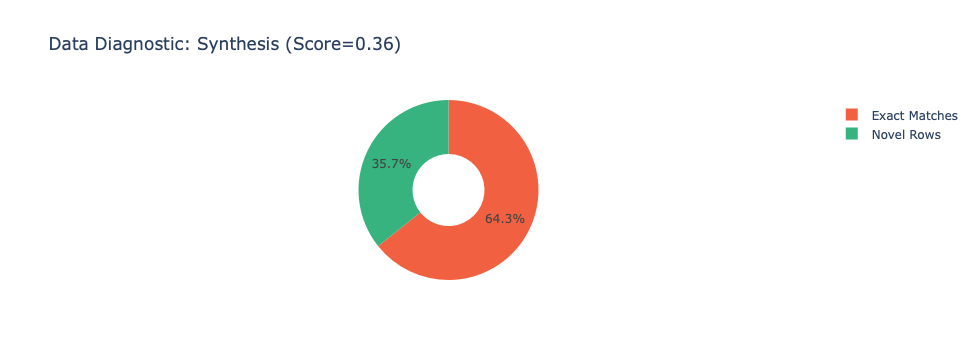

In [ ]:
# Synthesis
# How many synthetic rows are exact matches with the real data?
fig = report_diagnostic.get_visualization(property_name='Synthesis')
fig.show()

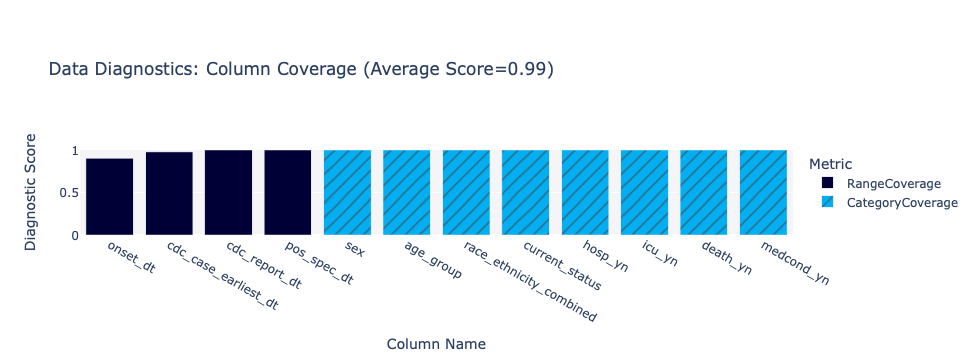

In [ ]:
# Coverage
# This metric measures whether a synthetic column covers all the possible categories 
# that are present in a real column. It only says something about the range, not about
# the actual distribution (so undersampling might still happen). If certain combinations
# are very rare you might get low scores here which can be solved by creating more samples
fig = report_diagnostic.get_visualization(property_name='Coverage')
fig.show()

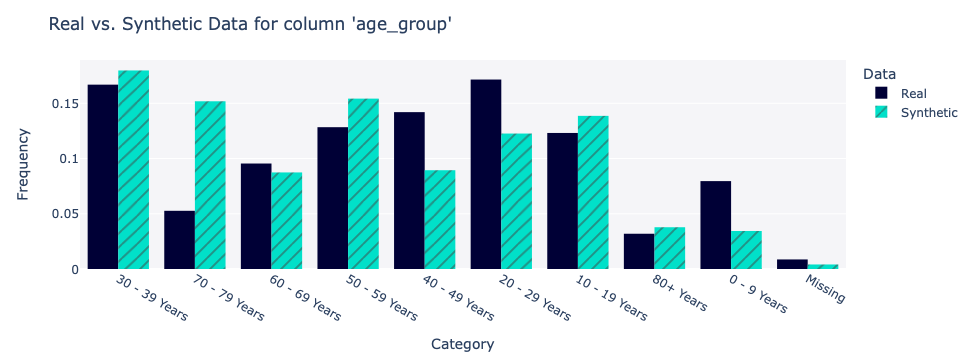

In [ ]:
# Single column comparison
# For a given column you want to know whether the synthetic data is similar to 
# the real data. This is done on frequency. 
fig = utils.get_column_plot(
    real_data=df,
    synthetic_data=synthetic_data,
    column_name='age_group',
    metadata=metadata
)
fig.show()

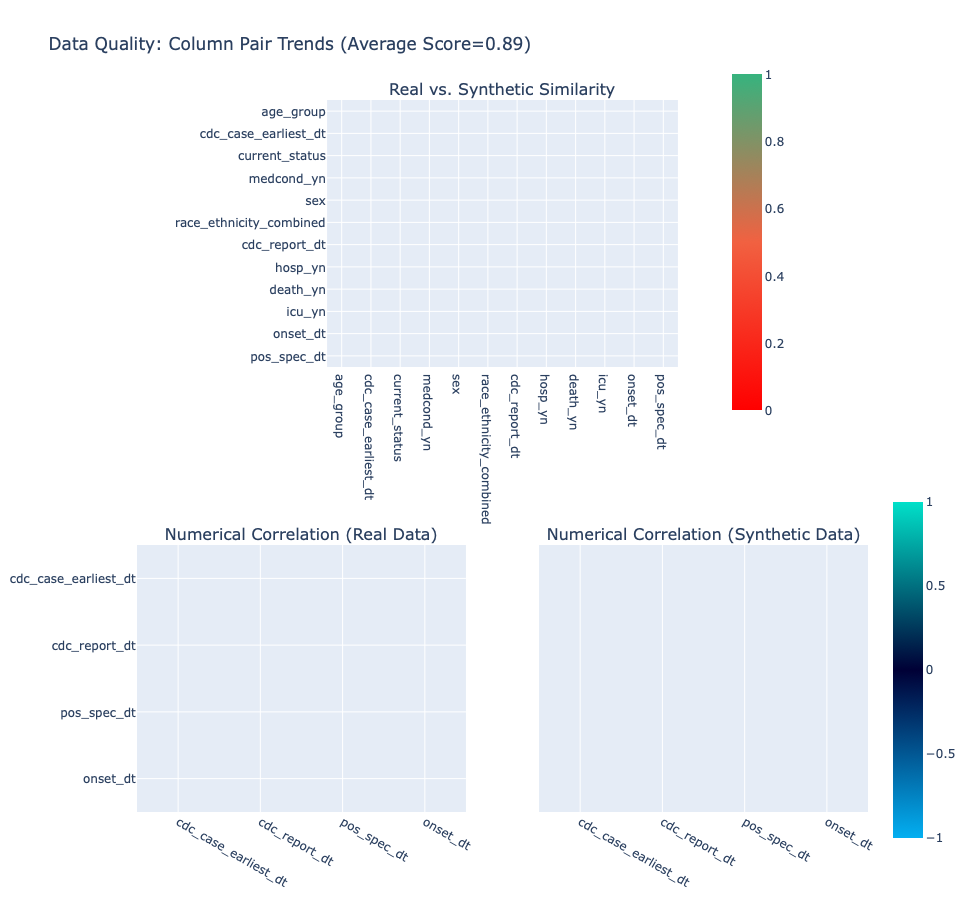

In [ ]:
# Trends between pairs of columns
# If both columns are numerical, the similarity is based on a simple correlation
# If both columns are categorical, the similarity is based on a contingency table 
# If there is a mixture, the numerical column is cut into histogram bins and then
#  a contingency table is created.

# The first visualization are all the column pairs between real and synthetic data
# The second visualization are the numerical columns within the real and synthetic 
# data. 
report_quality.get_visualization(property_name='Column Pair Trends')

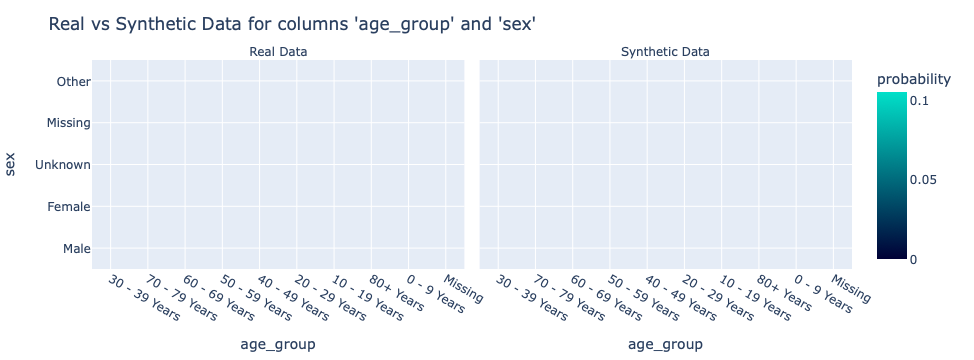

/Users/mckitchen/miniconda3/envs/py38_sdv/lib/python3.8/site-packages/sdmetrics/reports/utils.py:437: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



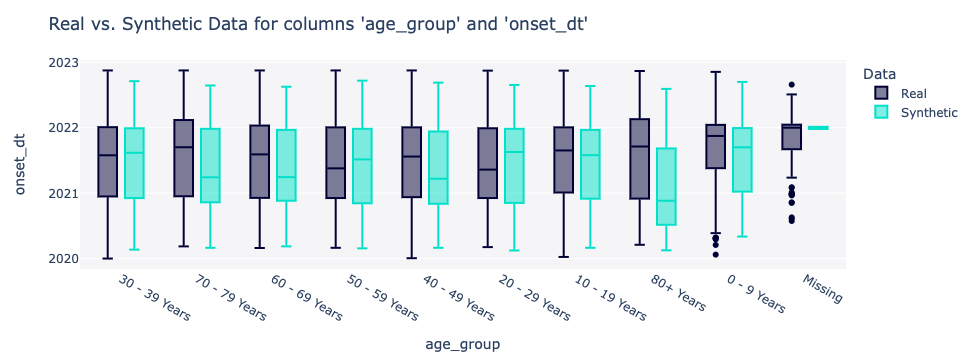

In [ ]:
# Column pairplots
# Note that depending on the column type combinations the function
# will generate a different type of figure. 
#
# For instance two categorical columns will result in a probability heatmap.
# The probability that a given sample belongs to a given cell combination
# based on two columns. The total sum of all cells is equal to 1.0
fig = utils.get_column_pair_plot(
    real_data=df,
    synthetic_data=synthetic_data,
    column_names=["age_group", "sex"],
    metadata=metadata 
)
fig.show()

# Or if one of the two columns is contineous (date for instance), you 
# will get a box and whisker plot: 
fig = utils.get_column_pair_plot(
    real_data=df,
    synthetic_data=synthetic_data,
    column_names=["age_group", "onset_dt"],
    metadata=metadata
)
fig.show()